In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import feature, color
from skimage.io import imread
from skimage.feature import blob_log, blob_dog, blob_doh
from math import sqrt

# Load image
image = cv2.imread("Picture1.jpg")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


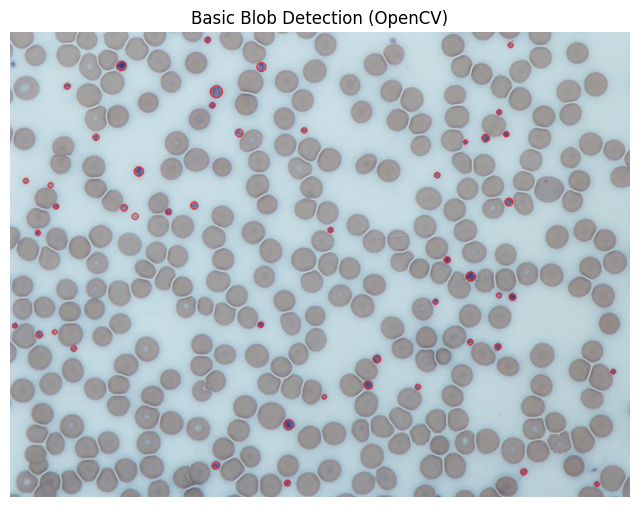

In [ ]:
#BASIC BLOB DETECTION-> IMAGE-1
# Set up detector with default parameters
params = cv2.SimpleBlobDetector_Params()

# Filter blobs by area
params.filterByArea = True
params.minArea = 15
params.maxArea = 250

# Circular blobs
params.filterByCircularity = True
params.minCircularity = 0.6

# Detect darker blobs on lighter background
params.blobColor = 0

# Create detector and detect blobs
detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(gray)

# Draw blobs
im_with_keypoints = cv2.drawKeypoints(image, keypoints, np.array([]), (0, 0, 255),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Show result
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(im_with_keypoints, cv2.COLOR_BGR2RGB))
plt.title("Basic Blob Detection (OpenCV)")
plt.axis('off')
plt.show()


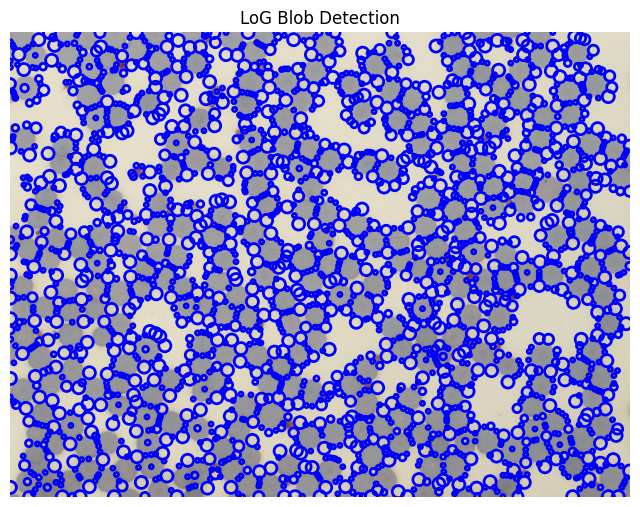

In [ ]:
# LoG detection-> Image-1
blobs_log = blob_log(gray, min_sigma=2, max_sigma=6, num_sigma=10, threshold=0.02)

# Compute radii
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)

# Plot
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
for blob in blobs_log:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='blue', linewidth=2, fill=False)
    ax.add_patch(c)
ax.set_title('LoG Blob Detection')
ax.axis('off')
plt.show()


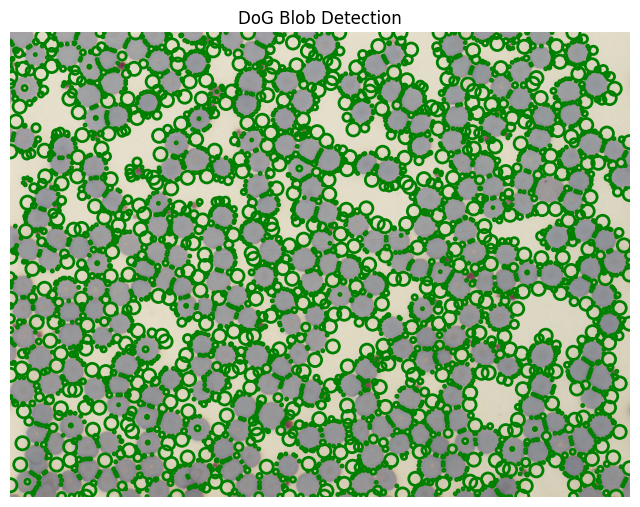

In [ ]:
# DoG detection-> Image-1
blobs_dog = blob_dog(gray, max_sigma=10, threshold=0.02)
blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)

# Plot
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
for blob in blobs_dog:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='green', linewidth=2, fill=False)
    ax.add_patch(c)
ax.set_title('DoG Blob Detection')
ax.axis('off')
plt.show()


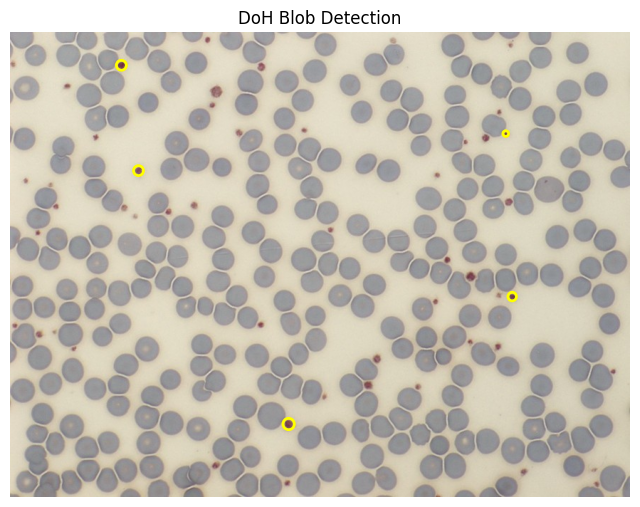

In [ ]:
# DoH detection-> Image-1
blobs_doh = blob_doh(gray, max_sigma=10, threshold=0.01)

# Plot
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image)
for blob in blobs_doh:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='yellow', linewidth=2, fill=False)
    ax.add_patch(c)
ax.set_title('DoH Blob Detection')
ax.axis('off')
plt.show()


In [ ]:
# Load candy image
image_candy = cv2.imread("Picture2.jpg")
gray_candy = cv2.cvtColor(image_candy, cv2.COLOR_BGR2GRAY)


In [ ]:
def plot_blobs(image_candy, blobs, title, color='red'):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(cv2.cvtColor(image_candy, cv2.COLOR_BGR2RGB))
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax.add_patch(c)
    ax.set_title(f"{title} (Count = {len(blobs)})")
    ax.axis('off')
    plt.show()

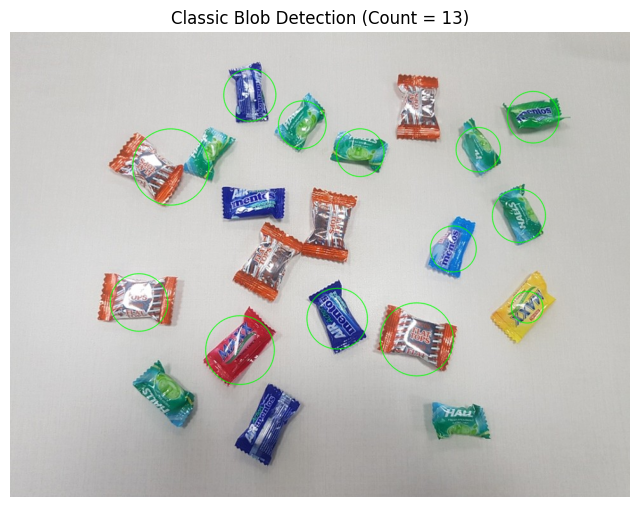

In [ ]:
#Basic Blob Detection-> Image-2
# Preprocess image
blurred = cv2.GaussianBlur(gray_candy, (9, 9), 0)
_, thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
kernel = np.ones((5, 5), np.uint8)
morphed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

# Configure parameters
params = cv2.SimpleBlobDetector_Params()
params.filterByArea = True
params.minArea = 500
params.maxArea = 50000
params.filterByCircularity = False
params.filterByConvexity = False
params.filterByInertia = False
params.blobColor = 255

detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(morphed)

# Draw keypoints
img_keypoints = cv2.drawKeypoints(image_candy, keypoints, np.array([]), (0, 255, 0),
                                  cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Show result
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(img_keypoints, cv2.COLOR_BGR2RGB))
plt.title(f"Classic Blob Detection (Count = {len(keypoints)})")
plt.axis('off')
plt.show()


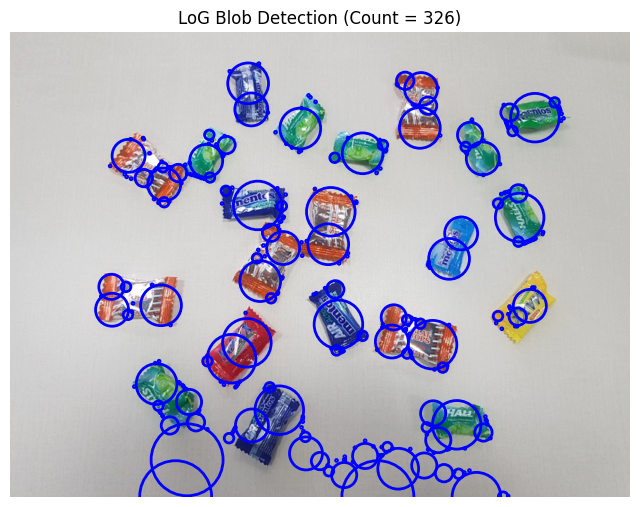

In [ ]:
blobs_log = blob_log(morphed, max_sigma=40, num_sigma=10, threshold=0.01)
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)
plot_blobs(image_candy, blobs_log, "LoG Blob Detection", color='blue')


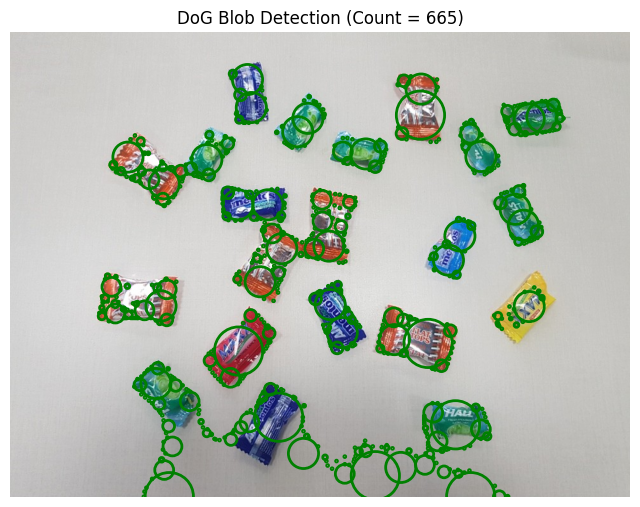

In [ ]:
blobs_dog = blob_dog(morphed, max_sigma=40, threshold=0.01)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)
plot_blobs(image_candy, blobs_dog, "DoG Blob Detection", color='green')


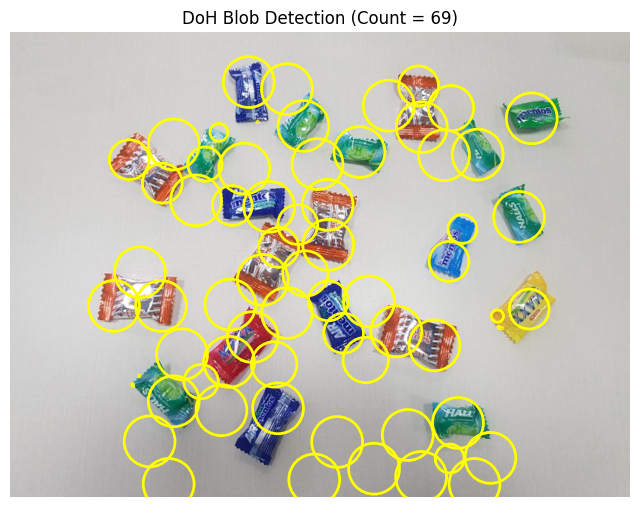

In [ ]:
blobs_doh = blob_doh(morphed, max_sigma=40, threshold=0.01)
plot_blobs(image_candy, blobs_doh, "DoH Blob Detection", color='yellow')


In [ ]:
#IMAGE-3
# Load satellite image
image_satellite = cv2.imread("Picture3.png")
gray_satellite = cv2.cvtColor(image_satellite, cv2.COLOR_BGR2GRAY)


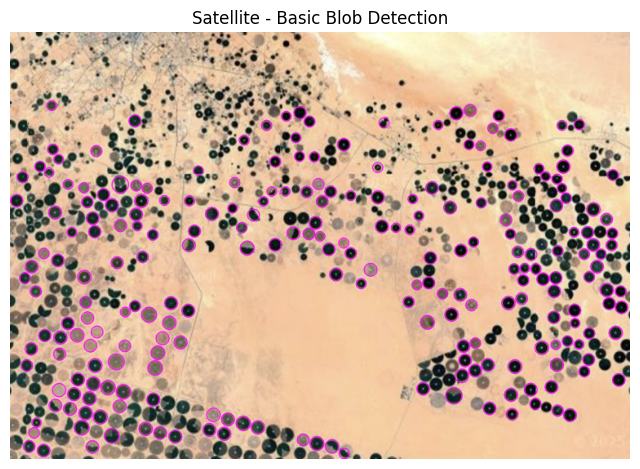

In [ ]:
params = cv2.SimpleBlobDetector_Params()
params.filterByArea = True
params.minArea = 100  # These blobs are small compared to image
params.maxArea = 5000
params.filterByCircularity = True
params.minCircularity = 0.7
params.blobColor = 0  # Dark blobs

detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(gray_satellite)

im_keypoints = cv2.drawKeypoints(image_satellite, keypoints, np.array([]), (255, 0, 255),
                                 cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(im_keypoints, cv2.COLOR_BGR2RGB))
plt.title("Satellite - Basic Blob Detection")
plt.axis('off')
plt.show()


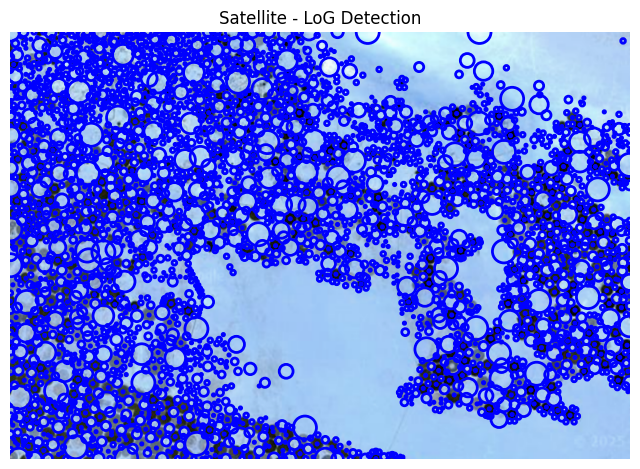

In [ ]:
blobs_log = blob_log(gray_satellite, max_sigma=10, num_sigma=10, threshold=0.02)
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image_satellite)
for blob in blobs_log:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='blue', linewidth=2, fill=False)
    ax.add_patch(c)
ax.set_title('Satellite - LoG Detection')
ax.axis('off')
plt.show()


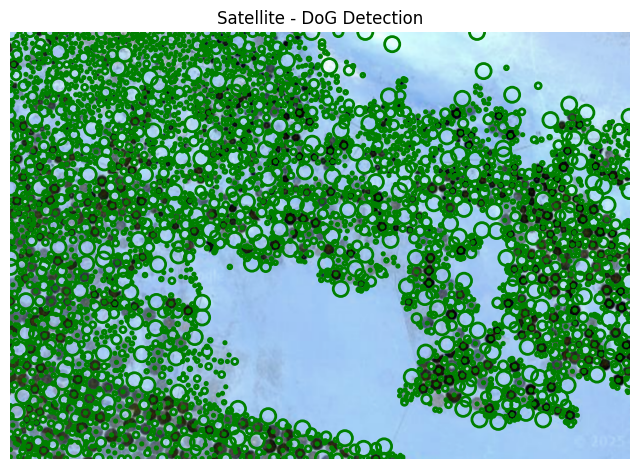

In [ ]:
blobs_dog = blob_dog(gray_satellite, max_sigma=10, threshold=0.02)
blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image_satellite)
for blob in blobs_dog:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='green', linewidth=2, fill=False)
    ax.add_patch(c)
ax.set_title('Satellite - DoG Detection')
ax.axis('off')
plt.show()


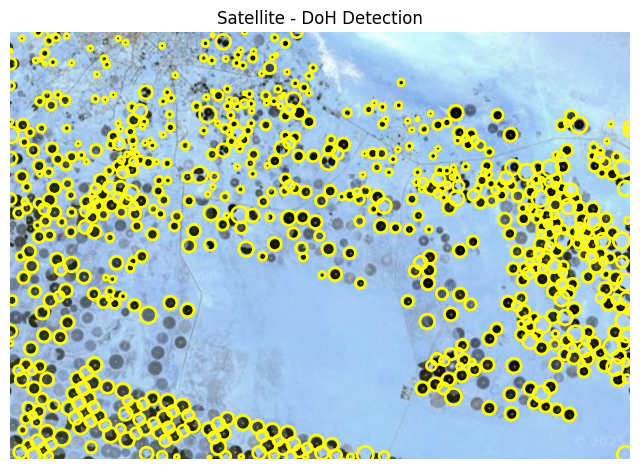

In [ ]:
blobs_doh = blob_doh(gray_satellite, max_sigma=10, threshold=0.01)

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(image_satellite)
for blob in blobs_doh:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='yellow', linewidth=2, fill=False)
    ax.add_patch(c)
ax.set_title('Satellite - DoH Detection')
ax.axis('off')
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load and convert original image
image_path = "Picture5.jpg"
original = cv2.imread(image_path)
original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

# Step 1: Brightness & Contrast
bright_contrast = cv2.convertScaleAbs(original_rgb, alpha=1.2, beta=30)

# Step 2: Bilateral Filter (Noise Reduction)
bilateral = cv2.bilateralFilter(original_rgb, d=9, sigmaColor=75, sigmaSpace=75)

# Step 3: Sharpening
kernel = np.array([[-1, -1, -1],
                   [-1,  9, -1],
                   [-1, -1, -1]])
sharpened = cv2.filter2D(original_rgb, -1, kernel)

# Step 4: Color Enhancement (Saturation boost)
hsv = cv2.cvtColor(original_rgb, cv2.COLOR_RGB2HSV)
hsv[:, :, 1] = cv2.add(hsv[:, :, 1], 40)
color_enhanced = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

# Step 5: Resizing and Scaling
resized = cv2.resize(original_rgb, (512, 512))

# Step 6: Inverse Transform (Color Inversion)
inverted = cv2.bitwise_not(original_rgb)

# Step 7: Histogram Equalization
img_yuv = cv2.cvtColor(original_rgb, cv2.COLOR_RGB2YUV)
img_yuv[:, :, 0] = cv2.equalizeHist(img_yuv[:, :, 0])
hist_eq = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)

# Step 8: Super-resolution (Simulated with cubic upscale)
super_res = cv2.resize(original_rgb, (1024, 1024), interpolation=cv2.INTER_CUBIC)

# Step 9: Color Correction (White Balance Approx)
lab = cv2.cvtColor(original_rgb, cv2.COLOR_RGB2LAB).astype(np.float32)
avg_a = np.average(lab[:, :, 1])
avg_b = np.average(lab[:, :, 2])
lab[:, :, 1] -= ((avg_a - 128) * (lab[:, :, 0] / 255.0) * 1.1)
lab[:, :, 2] -= ((avg_b - 128) * (lab[:, :, 0] / 255.0) * 1.1)
lab = np.clip(lab, 0, 255).astype(np.uint8)
color_corrected = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

# Store all steps
steps = [
    ("Original", original_rgb),
    ("1. Bright & Contrast", bright_contrast),
    ("2. Bilateral Filter", bilateral),
    ("3. Sharpened", sharpened),
    ("4. Color Enhanced", color_enhanced),
    ("5. Resized", resized),
    ("6. Inverse Transform", inverted),
    ("7. Histogram Equalized", hist_eq),
    ("8. Super-Resolution", super_res),
    ("9. Color Corrected", color_corrected),
]


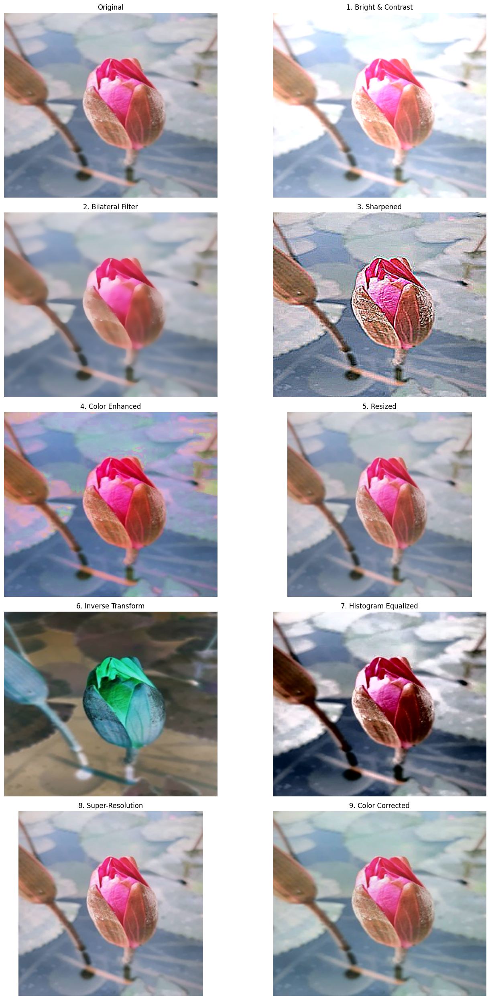

In [ ]:

for i in range(len(steps)):
    if steps[i][1].shape[0] > 512:
        steps[i] = (steps[i][0], cv2.resize(steps[i][1], (512, 512)))

# Display grid
fig, axs = plt.subplots(5, 2, figsize=(15, 25))
axs = axs.flatten()

for ax, (title, img) in zip(axs, steps):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
# Step 1: Install required libraries
# !pip install torch torchvision deeplake tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torch.utils.data import DataLoader, Subset
from torchvision.datasets import CIFAR100
import time
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

# Step 2: Load and preprocess CIFAR-100 (using only 5 classes)
selected_classes = ['apple', 'aquarium_fish', 'baby', 'bear', 'bicycle']

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize for pretrained models
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

full_train_set = CIFAR100(root='./data', train=True, download=True, transform=transform)
full_test_set = CIFAR100(root='./data', train=False, download=True, transform=transform)

def filter_classes(dataset, selected_classes):
    idx = [i for i, (_, label) in enumerate(dataset) if dataset.classes[label] in selected_classes]
    subset = Subset(dataset, idx)
    class_to_idx = {cls: i for i, cls in enumerate(selected_classes)}

    # Remap labels to 0-4
    subset.dataset.targets = [class_to_idx[dataset.classes[label]] if dataset.classes[label] in selected_classes else -1
                              for label in dataset.targets]
    return subset

train_set = filter_classes(full_train_set, selected_classes)
test_set = filter_classes(full_test_set, selected_classes)

train_loader = DataLoader(train_set, batch_size=64, shuffle=True)
test_loader = DataLoader(test_set, batch_size=64, shuffle=False)

# Step 3: Load pretrained models and modify output layers
def get_model(name, num_classes=5):
    if name == "alexnet":
        model = models.alexnet(pretrained=True)
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
    elif name == "vgg16":
        model = models.vgg16(pretrained=True)
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
    return model.to(device)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Step 4: Train the model
def train_model(model, train_loader, criterion, optimizer, epochs=5):
    model.train()
    for epoch in range(epochs):
        running_loss = 0
        correct, total = 0, 0
        for images, labels in tqdm(train_loader):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

        print(f"Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader):.4f}, Accuracy: {100*correct/total:.2f}%")

# Step 5: Evaluate performance
def evaluate_model(model, test_loader):
    model.eval()
    correct, total = 0, 0
    total_time = 0
    with torch.no_grad():
        for images, labels in tqdm(test_loader):
            images, labels = images.to(device), labels.to(device)
            start = time.time()
            outputs = model(images)
            total_time += time.time() - start
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)
    accuracy = 100 * correct / total
    avg_inference_time = total_time / total
    print(f"Accuracy: {accuracy:.2f}%, Avg. Inference Time: {avg_inference_time:.6f} seconds/image")
    return accuracy, avg_inference_time

# Initialize models
alexnet = get_model("alexnet")
vgg16 = get_model("vgg16")

criterion = nn.CrossEntropyLoss()
optimizer_alex = optim.Adam(alexnet.parameters(), lr=0.0001)
optimizer_vgg = optim.Adam(vgg16.parameters(), lr=0.0001)

# Train
print("\nTraining AlexNet:")
train_model(alexnet, train_loader, criterion, optimizer_alex)

print("\nTraining VGG16:")
train_model(vgg16, train_loader, criterion, optimizer_vgg)

# Step 6: Compare Results
print("\nEvaluating AlexNet:")
acc_alex, time_alex = evaluate_model(alexnet, test_loader)

print("\nEvaluating VGG16:")
acc_vgg, time_vgg = evaluate_model(vgg16, test_loader)

print("\n--- Final Comparison ---")
print(f"AlexNet -> Accuracy: {acc_alex:.2f}%, Inference Time: {time_alex:.6f}s/image")
print(f"VGG16   -> Accuracy: {acc_vgg:.2f}%, Inference Time: {time_vgg:.6f}s/image")


100%|██████████| 169M/169M [00:12<00:00, 13.1MB/s]
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 187MB/s]
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'we


Training AlexNet:


100%|██████████| 40/40 [00:08<00:00,  4.49it/s]


Epoch [1/5], Loss: 0.4287, Accuracy: 84.80%


100%|██████████| 40/40 [00:06<00:00,  6.04it/s]


Epoch [2/5], Loss: 0.1111, Accuracy: 96.16%


100%|██████████| 40/40 [00:06<00:00,  5.76it/s]


Epoch [3/5], Loss: 0.0901, Accuracy: 97.00%


100%|██████████| 40/40 [00:07<00:00,  5.70it/s]


Epoch [4/5], Loss: 0.0267, Accuracy: 99.12%


100%|██████████| 40/40 [00:06<00:00,  6.12it/s]


Epoch [5/5], Loss: 0.0135, Accuracy: 99.52%

Training VGG16:


100%|██████████| 40/40 [00:37<00:00,  1.06it/s]


Epoch [1/5], Loss: 0.3667, Accuracy: 86.96%


100%|██████████| 40/40 [00:38<00:00,  1.04it/s]


Epoch [2/5], Loss: 0.0787, Accuracy: 97.68%


100%|██████████| 40/40 [00:39<00:00,  1.02it/s]


Epoch [3/5], Loss: 0.0553, Accuracy: 98.12%


100%|██████████| 40/40 [00:38<00:00,  1.03it/s]


Epoch [4/5], Loss: 0.0382, Accuracy: 98.92%


100%|██████████| 40/40 [00:39<00:00,  1.03it/s]


Epoch [5/5], Loss: 0.0453, Accuracy: 98.64%

Evaluating AlexNet:


100%|██████████| 8/8 [00:00<00:00,  8.16it/s]


Accuracy: 97.80%, Avg. Inference Time: 0.000030 seconds/image

Evaluating VGG16:


100%|██████████| 8/8 [00:03<00:00,  2.34it/s]

Accuracy: 96.00%, Avg. Inference Time: 0.000062 seconds/image

--- Final Comparison ---
AlexNet -> Accuracy: 97.80%, Inference Time: 0.000030s/image
VGG16   -> Accuracy: 96.00%, Inference Time: 0.000062s/image
